In [26]:
%reload_ext autoreload
%autoreload 2

import os
from PIL import Image
from utils import *

In [146]:
data = get_ground_truth_data(100)
data

,image,MEL,NV,BCC,AK,BKL,DF,VASC,SCC,UNK,Cat,y
0,ISIC_0024904,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,VASC,0
1,ISIC_0062584,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,VASC,0
2,ISIC_0024706,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,VASC,0
3,ISIC_0065888,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,SCC,1
4,ISIC_0031526,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,BCC,1
...,...,...,...,...,...,...,...,...,...,...,...,...
91,ISIC_0026417,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,DF,0
92,ISIC_0067762,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,DF,0
93,ISIC_0000011,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NV,0
94,ISIC_0068615,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,SCC,1


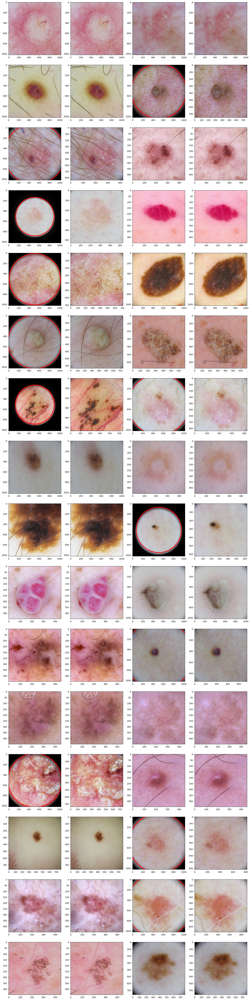

In [63]:
n_samples = 32
image_samples= get_ground_truth_data(n_samples)

num_cols = 4  # Number of columns in the grid
num_rows = (n_samples*2 - 1) // num_cols + 1  # Number of rows in the grid

fig, axes = plt.subplots(num_rows, num_cols, figsize=(4*num_cols, 4*num_rows))

for i in range(n_samples):
    sample=image_samples.loc[i]
    image_file_name=f"{os.path.sep.join(['raw_data', sample.Cat, sample.image])}.jpg"
    image = Image.open(image_file_name)
    image = square_image(image)
    radius = detect_black_coners(image)
    
    ax = axes[i*2 // num_cols, i*2 % num_cols] if num_rows > 1 else axes[i % num_cols]
    display_image_with_circle(image, radius, ax)
    if radius> 0:
        image_cropped=remove_black_cornors(image, radius=radius)
    else: image_cropped = image
    ax = axes[i*2 // num_cols, i*2 % num_cols+1] if num_rows > 1 else axes[i % num_cols]
    display_image(image_cropped, ax)
    
plt.tight_layout()
plt.show()